This notebook will study the dynamics of the weights during learning as well as the integrator activity and the influence of Hebbian learning.

In [1]:
import os
import sys
import importlib
import numpy as np
script_dir = '/mnt/c/Users/kevin/OneDrive/2-code/1-Research_projects/1-project-categorical-MMN/notebooks'
src_dir = os.path.join(script_dir, '..', 'src')
sys.path.append(src_dir)
import parameters as params
import classes as cl
import basic_functions as bf
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
import plotly.express as px
params.PARAMS_Stimulus['nbr_rep_dev'] = 2
import plotly.graph_objects as go

params.PARAMS_PC['gA'] = -0.001
params.PARAMS_SST['gA'] = -0.001
params.PARAMS_Synapses_Integrator['wmax'] = 1.5*0.15/20


stim = cl.Stimulus(params.PARAMS_Stimulus, params.PARAMS_Simulation, params.PARAMS_PC['Ncells'])

time_range = np.arange(0, params.PARAMS_Simulation['t_total'], params.PARAMS_Simulation['dt'])

fig = go.Figure()


fig.add_trace(go.Scatter(x = time_range,y = stim.stimulus[20,:], mode = 'lines', name = 'stimulus 20'))
fig.add_trace(go.Scatter(x = time_range,y = stim.stimulus[88,:], mode = 'lines', name = 'stimulus 88'))



In [3]:
my_network = cl.Network(params.PARAMS_Integrator, params.PARAMS_Synapses_Integrator, params.PARAMS_PC, params.PARAMS_PV, params.PARAMS_SST, params.PARAMS_VIP, params.PARAMS_NDF, params.PARAMS_Simulation, params.PARAMS_Stimulus)
my_network.full_dynamics(stim.stimulus)


In [4]:
fig = go.Figure()

fig.add_trace(go.Scatter(x = time_range,y = my_network.save_pc_layer[20,:], mode = 'lines', name = 'PC 20'))
fig.add_trace(go.Scatter(x = time_range,y = my_network.save_pc_layer[88,:], mode = 'lines', name = 'PC 88'))


In [5]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = time_range,y = my_network.save_integrator_layer[20,:], mode = 'lines', name = 'Int 20'))
fig.add_trace(go.Scatter(x = time_range,y = my_network.save_integrator_layer[88,:], mode = 'lines', name = 'Int 88'))

In [6]:
fig = go.Figure()

df_integrator = pd.DataFrame(columns= ['time', 'Ncells', 'firing_rate', 'stim_id'])

for i in range(params.PARAMS_Integrator['Ncells']):
    for j in np.arange(4600,15000,700):
        df_integrator.loc[-1] = [j, i, my_network.save_integrator_layer[i,j], list(stim.stimulus[:,j]).index(max(stim.stimulus[:,j]))]
        df_integrator.index += 1


fig = px.scatter(df_integrator, x='Ncells', y='firing_rate', color='time',color_continuous_scale='balance', color_continuous_midpoint= 4600+5*700)


# fig.add_trace(go.Scatter(x = np.arange(params.PARAMS_Integrator['Ncells']),y = my_network.save_integrator_layer[:,4600], mode = 'lines', name = 'Time 4600'))
# fig.add_trace(go.Scatter(x = np.arange(params.PARAMS_Integrator['Ncells']),y = my_network.save_integrator_layer[:,5300], mode = 'lines', name = 'Time 5300'))
# fig.add_trace(go.Scatter(x = np.arange(params.PARAMS_Integrator['Ncells']),y = my_network.save_integrator_layer[:,6000], mode = 'lines', name = 'Time 6000'))
# fig.add_trace(go.Scatter(x = np.arange(params.PARAMS_Integrator['Ncells']),y = my_network.save_integrator_layer[:,6700], mode = 'lines', name = 'Time 6700'))
# fig.add_trace(go.Scatter(x = np.arange(params.PARAMS_Integrator['Ncells']),y = my_network.save_integrator_layer[:,7400], mode = 'lines', name = 'Time 7400'))
# fig.add_trace(go.Scatter(x = np.arange(params.PARAMS_Integrator['Ncells']),y = my_network.save_integrator_layer[:,8100], mode = 'lines', name = 'Time 8100'))
# fig.add_trace(go.Scatter(x = np.arange(params.PARAMS_Integrator['Ncells']),y = my_network.save_integrator_layer[:,8800], mode = 'lines', name = 'Time 8800'))

fig.show()


In [7]:
fig = go.Figure()

fig.add_trace(go.Scatter(x = time_range, y = my_network.W_integrator_to_ndf[20,:], mode = 'lines', name = 'W 20'))
fig.add_trace(go.Scatter(x = time_range, y = my_network.W_integrator_to_ndf[88,:], mode = 'lines', name = 'W 88'))

In [8]:
fig.add_trace(go.Scatter(x = time_range, y = my_network.W_integrator_to_ndf[:,20], mode = 'lines', name = 'W 20'))
fig.add_trace(go.Scatter(x = time_range, y = my_network.W_integrator_to_ndf[:,88], mode = 'lines', name = 'W 88'))

In [37]:
import plotly.io as pio
pio.renderers.default = 'notebook_connected'
df_W_int_to_ndf = pd.DataFrame(columns= ['time', 'Ncells', 'W_std','Id_receiver'])
for i in range(params.PARAMS_Integrator['Ncells']):
    for j in np.arange(4600,15000,125):
        df_W_int_to_ndf.loc[-1] = [j, i, my_network.save_W_standard_integrator_to_ndf[i,j],'std']
        df_W_int_to_ndf.index += 1
        df_W_int_to_ndf.loc[-1] = [j, i, my_network.save_W_dev_integrator_to_ndf[i,j],'dev']
        df_W_int_to_ndf.index += 1

df_W_int_to_ndf['time_s'] = df_W_int_to_ndf['time']/1000

temp = np.zeros(len(df_W_int_to_ndf['Ncells']))
for i in range(len(df_W_int_to_ndf['Ncells'])):
    temp[i] = stim.stimulus[:,df_W_int_to_ndf['time'][i]].argmax()



In [47]:
df_W_int_to_ndf['Id_stim'] = temp


TypeError: can only concatenate str (not "float") to str

In [39]:
df_W_int_to_ndf.head()

,time,Ncells,W_std,Id_receiver,time_s,Id_stim
21503,4600,0,0.000918,std,4.6,0.0
21502,4600,0,0.000715,dev,4.6,0.0
21501,4725,0,0.002070,std,4.725,0.0
21500,4725,0,0.000867,dev,4.725,0.0
21499,4850,0,0.003660,std,4.85,0.0


In [49]:
# fig = go.Figure()

# fig.add_trace(go.Scatter(x = df_W_int_to_ndf['Ncells'], y = df_W_int_to_ndf['W_std'], marker = dict( color = df_W_int_to_ndf['Id_receiver']), animation_frame = df_W_int_to_ndf['time'], range_y = [0.0,0.006], mode = 'lines', name = 'W std'))

# df_W_int_to_ndf['Id_stim'] = temp

fig = px.scatter(df_W_int_to_ndf, x='Ncells', y='W_std', color='Id_receiver',color_continuous_scale='balance', color_continuous_midpoint= 4.6+5*0.7, animation_frame='time_s', range_y=  [0.0, 0.006], title = 'Integrator to NDF')

# stim_to_df = stim.stimulus.copy()




fig.show()

In [50]:
plot_dir = os.path.join(script_dir, '..', 'plots/notebook5')

fig.write_html(os.path.join(plot_dir,'temp.html'))

In [52]:
df_W_ndf_to_dend = pd.DataFrame(columns= ['time', 'Ncells', 'W_std','Id_receiver'])
for i in range(params.PARAMS_Integrator['Ncells']):
    for j in np.arange(4600,15000,125):
        df_W_ndf_to_dend.loc[-1] = [j, i, my_network.save_W_standard_ndf_to_dend[i,j],'std']
        df_W_ndf_to_dend.index += 1
        df_W_ndf_to_dend.loc[-1] = [j, i, my_network.save_W_dev_ndf_to_dend[i,j],'dev']
        df_W_ndf_to_dend.index += 1

df_W_ndf_to_dend['time_s'] = df_W_ndf_to_dend['time']/1000

fig = px.scatter(df_W_ndf_to_dend, x='Ncells', y='W_std', color='Id_receiver',color_continuous_scale='balance', color_continuous_midpoint= 4.6+5*0.7, animation_frame='time_s', range_y=  [0.0, -0.065], title = 'Weights NDF to Dendrite')
fig.show()
fig.write_html(os.path.join(plot_dir,'weights_ndf_to_dend.html'))

In [11]:
df_W_int_to_dend = pd.DataFrame(columns= ['time', 'Ncells', 'W_std','Id_receiver'])
for i in range(params.PARAMS_Integrator['Ncells']):
    for j in np.arange(4600,15000,125):
        df_W_int_to_dend.loc[-1] = [j, i, my_network.save_W_standard_integrator_to_dend[i,j],'std']
        df_W_int_to_dend.index += 1
        df_W_int_to_dend.loc[-1] = [j, i, my_network.save_W_dev_integrator_to_dend[i,j],'dev']
        df_W_int_to_dend.index += 1


fig = px.scatter(df_W_int_to_dend, x='Ncells', y='W_std', color='Id_receiver',color_continuous_scale='balance', color_continuous_midpoint= 4600+5*700, animation_frame='time', range_y=  [0.0, 0.07])
fig.show()

In [12]:
df_W_dev_int_to_ndf = pd.DataFrame(columns= ['time', 'Ncells', 'W_std'])
for i in range(params.PARAMS_Integrator['Ncells']):
    for j in np.arange(4600,15000,700):
        df_W_dev_int_to_ndf.loc[-1] = [j, i, my_network.save_W_dev_integrator_to_ndf[i,j]]
        df_W_dev_int_to_ndf.index += 1


fig = px.scatter(df_W_dev_int_to_ndf, x='Ncells', y='W_std', color='time',color_continuous_scale='balance', color_continuous_midpoint= 4600+5*700)
fig.show()

In [13]:
fig = go.Figure()

fig.add_trace(go.Scatter(x = time_range, y = my_network.save_W_standard_ndf_to_dend[:,5300], mode = 'lines', name = 'W 20'))
fig.add_trace(go.Scatter(x = time_range, y = my_network.save_W_standard_ndf_to_dend[:,6000], mode = 'lines', name = 'W 20'))
fig.show()


doing the same thing but for integrator activity this time

In [76]:
df_int_activity = pd.DataFrame(columns= ['time', 'Ncells', 'activity', 'Id_receiver'])

for i in range(params.PARAMS_Integrator['Ncells']):
    for j in np.arange(4600,15000,125):
        df_int_activity.loc[-1] = [j, i, my_network.save_integrator_layer[i,j], stim.stimulus[:,j].argmax()]
        df_int_activity.index += 1



In [77]:


df_int_activity['time_s'] = df_int_activity['time']/1000

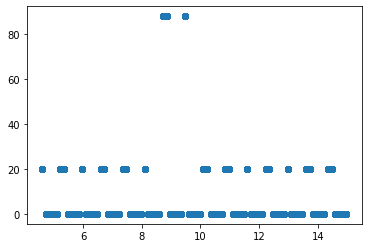

In [63]:
plt.scatter(x = df_int_activity['time_s'], y = df_int_activity['Id_receiver'])

In [79]:
fig = px.scatter(df_int_activity, x='Ncells', y='activity', color='Id_receiver',  animation_frame='time_s', range_y=  [0.0, 40.0],color_continuous_scale=[(0, "red"), (0.2, "green"), (1.0, "blue")], range_color = [0,88], title = 'Integrator activity', labels={'activity':'Firing rate (Hz)', 'Ncells':'Integrator cell index'})
# fig.layout.updatemenus[0].buttons[0].args[1]["transition"]["duration"] = 3
fig.show()

In [80]:
fig.write_html(os.path.join(plot_dir,'activity_integrator.html'))